<a href="https://colab.research.google.com/github/itsdivgithub/ChatGPT-Tweets-Sentiment-Analysis/blob/main/ChatGPT_Tweets_Sentiment_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df= pd.read_csv('/content/chatgpt_tweets.csv')

In [ ]:
df.shape

(33002, 20)

In [ ]:
df.head(10)

,tweet_id,tweet_created,tweet_extracted,text,lang,user_id,user_name,user_username,user_location,user_description,user_created,user_followers_count,user_following_count,user_tweet_count,user_verified,source,retweet_count,like_count,reply_count,impression_count
0,1.64E+18,2023-04-03 13:59:44+00:00,07:02.5,RT @jexep: เทคนิคฝึกภาษากับ ChatGPT ที่ผมลอง (...,th,4706577259,👷🏼 ♡ #GOT7,BPawarisa1a,ในใจJacksonwang,@JacksonWang852 ➖ รีวิว #รีวิวแบมพี #แบมพีอัพเ...,2016-01-04 02:27:33+00:00,1293.0,445.0,87051.0,False,NaN,13640.0,0.0,0.0,0.0
1,1.64E+18,2023-04-03 10:59:22+00:00,06:59.4,ChatGPTをもっと活かせるChrome拡張機能4選 https://t.co/hfacF...,ja,2264288640,ミミズクりんゆ,DRVO_Project,東京←岐阜,料理垢です。ｳｪｯﾌﾞ4年目 発言はファッキン個人の見解 TypeScript/Vue/Re...,2013-12-27 12:39:07+00:00,7878.0,4941.0,76597.0,False,NaN,0.0,0.0,0.0,290.0
2,1.64E+18,2023-04-03 03:59:28+00:00,06:52.5,RT @DarrellLerner: ChatGPT Plugins are the fas...,en,2383245894,pk,pradeep42329225,India,💐💐।।जय श्री महाकाल।।💐💐,2014-03-11 06:04:10+00:00,269.0,4141.0,3816.0,False,NaN,628.0,0.0,0.0,0.0
3,1.64E+18,2023-04-03 15:59:59+00:00,07:04.7,Get an intelligent chatbot for your website in...,en,1.63304E+18,AR Leyva,ArrheniusLey,United Kingdom,Passionate about AI and its potential to trans...,2023-03-07 09:43:36+00:00,264.0,24.0,198.0,False,NaN,0.0,0.0,0.0,58.0
4,1.64E+18,2023-04-03 01:59:25+00:00,06:50.6,"🔥Hey Guys, #ZenithSwap has launched at just $ ...",en,1.3114E+18,Human Being 🇨🇳🇸🇬🇻🇳,KiarostamiBeing,"Chicago, IL",Freedom is the Recognition of Necessity • Mark...,2020-09-30 20:32:00+00:00,447.0,419.0,12949.0,False,NaN,0.0,0.0,0.0,0.0
5,1.64E+18,2023-04-03 11:59:28+00:00,07:00.4,RT @sinsonetwork: Now! Join #SINSO DataLand^Ch...,en,462142717,MokoHaram,holymoko,Zambia mufulira,Public faker🍂,2012-01-12 16:25:12+00:00,2286.0,982.0,20438.0,False,NaN,270.0,0.0,0.0,0.0
6,1.64E+18,2023-04-03 00:59:27+00:00,06:49.8,RT @igz0: 著者がジョン・フォン・ノイマンの本を読んだことあるけど、脳がコンピュータ...,ja,1.64269E+18,Inventor2525,inventor2525,South West Michigan,"Half crazy roboticist (soft and ag), dabbling ...",2023-04-03 00:27:32+00:00,3.0,15.0,9.0,False,NaN,876.0,0.0,0.0,0.0
7,1.64E+18,2023-04-03 20:59:31+00:00,07:10.6,#japan #ai #openai #chatgpt #wordoftheday \n教え...,ja,45437316,Nuno Luciano,nunoluciano,"Geneva, Switzerland","Earth is My Homeland,\nHumanity is My Family !...",2009-06-07 22:18:32+00:00,382.0,608.0,14578.0,False,NaN,0.0,2.0,0.0,16.0
8,1.64E+18,2023-04-03 17:59:40+00:00,07:07.1,Hvorfor vil #ChatGPT spøke med Joe Biden men i...,no,17425802,Kristoffer Rønneberg,ronneberg,"Oslo, Norge","Reporter, former China and US correspondent @A...",2008-11-16 18:33:43+00:00,8817.0,4340.0,14946.0,True,NaN,4.0,75.0,8.0,17721.0
9,1.64E+18,2023-04-03 12:59:26+00:00,07:01.4,The plagiarism detector will introduce its #AI...,en,8.96094E+17,Dr. Susan D'Agostino,susan_dagostino,"New Hampshire, USA",Tech reporter @insidehighered. Mathematician. ...,2017-08-11 19:41:50+00:00,4444.0,1924.0,3320.0,True,NaN,7.0,22.0,1.0,5769.0


In [ ]:
df.columns

Index(['tweet_id', 'tweet_created', 'tweet_extracted', 'text', 'lang',
       'user_id', 'user_name', 'user_username', 'user_location',
       'user_description', 'user_created', 'user_followers_count',
       'user_following_count', 'user_tweet_count', 'user_verified', 'source',
       'retweet_count', 'like_count', 'reply_count', 'impression_count'],
      dtype='object')

In [ ]:
df.isnull().sum()

tweet_id                    0
tweet_created               0
tweet_extracted             0
text                        0
lang                        0
user_id                     0
user_name                   3
user_username               0
user_location           13402
user_description         5108
user_created                4
user_followers_count        6
user_following_count        6
user_tweet_count            6
user_verified               6
source                  33002
retweet_count               6
like_count                  6
reply_count                 6
impression_count            6
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df=df.drop(['user_location', 'user_description','source'], axis=1)

In [ ]:
df=df.dropna()

In [ ]:
df.isna().sum()

tweet_id                0
tweet_created           0
tweet_extracted         0
text                    0
lang                    0
user_id                 0
user_name               0
user_username           0
user_created            0
user_followers_count    0
user_following_count    0
user_tweet_count        0
user_verified           0
retweet_count           0
like_count              0
reply_count             0
impression_count        0
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 32995 entries, 0 to 33001
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tweet_id              32995 non-null  object 
 1   tweet_created         32995 non-null  object 
 2   tweet_extracted       32995 non-null  object 
 3   text                  32995 non-null  object 
 4   lang                  32995 non-null  object 
 5   user_id               32995 non-null  object 
 6   user_name             32995 non-null  object 
 7   user_username         32995 non-null  object 
 8   user_created          32995 non-null  object 
 9   user_followers_count  32995 non-null  float64
 10  user_following_count  32995 non-null  float64
 11  user_tweet_count      32995 non-null  float64
 12  user_verified         32995 non-null  object 
 13  retweet_count         32995 non-null  float64
 14  like_count            32995 non-null  float64
 15  reply_count        

In [ ]:
df.describe()

,user_followers_count,user_following_count,user_tweet_count,retweet_count,like_count,reply_count,impression_count
count,3.299500e+04,32995.000000,3.299500e+04,32995.000000,32995.000000,32995.000000,3.299500e+04
mean,6.779823e+03,1482.382543,5.474907e+04,1413.255584,3.244552,0.309986,5.169166e+02
std,1.781748e+05,7625.032530,1.889855e+05,4290.224660,89.619323,11.375100,1.401990e+04
min,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00
25%,4.800000e+01,149.000000,9.850000e+02,0.000000,0.000000,0.000000,0.000000e+00
50%,2.250000e+02,450.000000,6.363000e+03,29.000000,0.000000,0.000000,0.000000e+00
75%,9.625000e+02,1248.000000,3.425000e+04,825.000000,0.000000,0.000000,1.700000e+01
max,2.720585e+07,414729.000000,3.384535e+06,42330.000000,9170.000000,2009.000000,1.220101e+06


In [ ]:
df.nunique()

tweet_id                  493
tweet_created           22191
tweet_extracted           787
text                    19511
lang                       54
user_id                 27614
user_name               28586
user_username           29141
user_created            29122
user_followers_count     5772
user_following_count     4801
user_tweet_count        19339
user_verified               2
retweet_count            1934
like_count                178
reply_count                54
impression_count         1591
dtype: int64

In [ ]:
obj_columns= df.select_dtypes(include='object').columns
obj_columns

Index(['tweet_id', 'tweet_created', 'tweet_extracted', 'text', 'lang',
       'user_id', 'user_name', 'user_username', 'user_created',
       'user_verified'],
      dtype='object')

In [ ]:
num_columns= df.select_dtypes(include='float64').columns
num_columns

Index(['user_followers_count', 'user_following_count', 'user_tweet_count',
       'retweet_count', 'like_count', 'reply_count', 'impression_count'],
      dtype='object')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df['lang'].unique()

array(['th', 'ja', 'en', 'no', 'zh', 'fr', 'it', 'ca', 'ar', 'es', 'iw',
       'und', 'de', 'tr', 'ko', 'pt', 'qme', 'ru', 'fa', 'cy', 'ht', 'uk',
       'vi', 'pl', 'zxx', 'cs', 'in', 'el', 'da', 'nl', 'tl', 'sv', 'ur',
       'hu', 'qht', 'sr', 'sl', 'lt', 'ta', 'hi', 'fi', 'et', 'lv', 'gu',
       'ml', 'ro', 'ckb', 'mr', 'qam', 'hy', 'eu', 'kn', 'ne', 'bg'],
      dtype=object)

In [ ]:
lang_counts=df['lang'].value_counts()
lang_counts

en     15239
ja      8026
es      3082
fr      1215
zh      1152
pt       787
th       571
tr       454
ar       431
ko       346
de       311
in       210
it       164
und      148
qme      135
zxx       95
fa        83
ru        70
ca        69
pl        54
nl        52
cy        32
cs        28
hi        25
fi        23
tl        23
iw        21
sv        20
uk        19
el        12
ur        11
da         9
ht         8
hu         7
vi         7
ta         7
qht        6
sl         6
et         6
lv         5
qam        4
sr         3
ml         3
ro         3
no         2
gu         2
mr         2
lt         1
ckb        1
hy         1
eu         1
kn         1
ne         1
bg         1
Name: lang, dtype: int64

In [ ]:
top_10_lang= lang_counts.head(10)
top_10_lang

en    15239
ja     8026
es     3082
fr     1215
zh     1152
pt      787
th      571
tr      454
ar      431
ko      346
Name: lang, dtype: int64

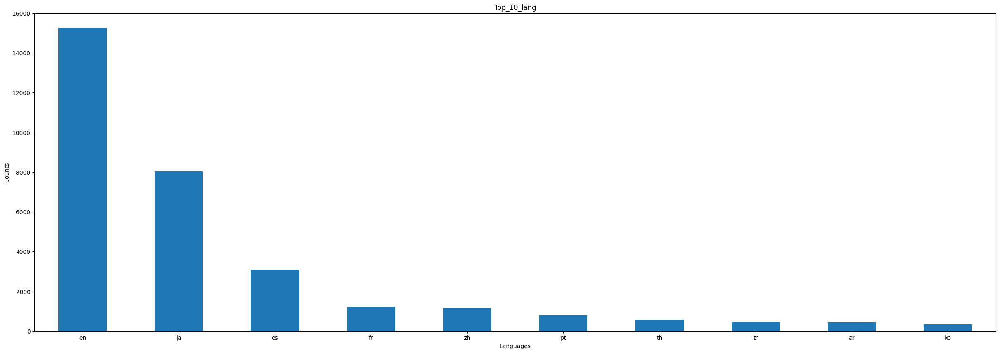

In [ ]:
plt.figure(figsize=(30, 10))
top_10_lang.plot(kind='bar')
plt.xlabel('Languages')
plt.ylabel('Counts')
plt.title('Top_10_lang')
plt.xticks(rotation=0)
plt.show()


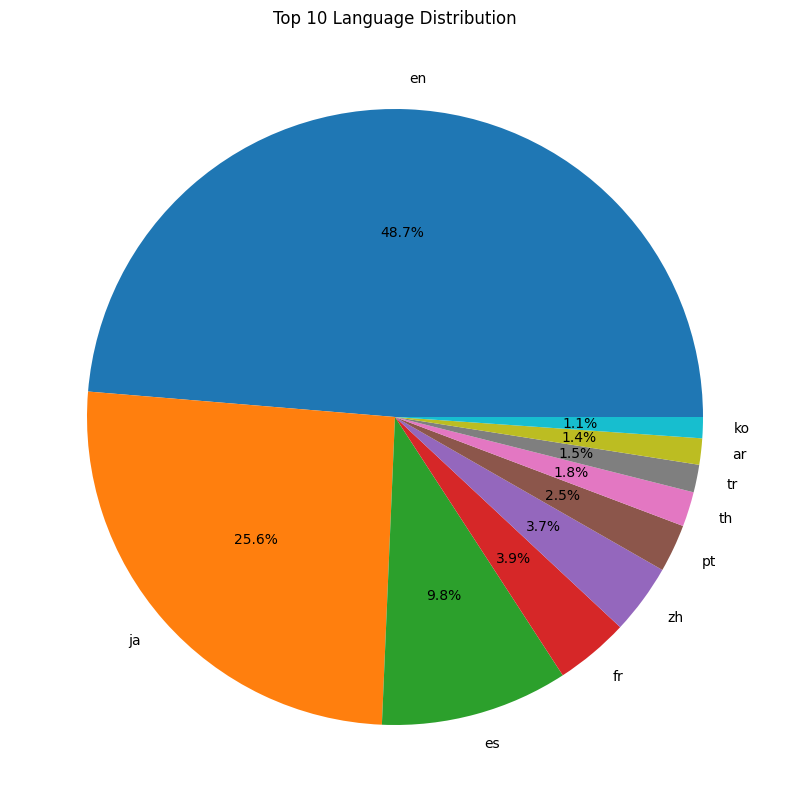

In [ ]:
plt.figure(figsize=(30, 10))
plt.pie(top_10_lang.values, labels=top_10_lang.index, autopct='%1.1f%%')
plt.title('Top 10 Language Distribution')
plt.show()

In [ ]:
import plotly.express as px

In [ ]:
top_10_df=pd.DataFrame({'Language': top_10_lang.index , 'Count': top_10_lang.values})

In [ ]:
fig=px.bar(top_10_df, x='Language', y='Count', labels={'Language': 'Language', 'Count':'Count'})
fig.update_layout(xaxis_tickangle=0)
fig.show()

In [ ]:
fig_pie= px.pie(top_10_df, values='Count', names='Language', title='Top 10 Languages Distribution')
fig_pie.show()

In [ ]:
df['user_verified'].unique()

array([False, True], dtype=object)

In [ ]:
verified_counts=df['user_verified'].value_counts()
verified_counts

False    31045
True      1950
Name: user_verified, dtype: int64

In [ ]:
fig_count=px.bar(x=verified_counts.index, y=verified_counts.values, labels={'x':'user_verified', 'y':'Counts'}, title='User_Verification_Status')
fig_count.show()

In [ ]:
fig_pie=px.pie(names=verified_counts.index, values=verified_counts.values, title='User Verification Status Distribution')
fig_pie.show()

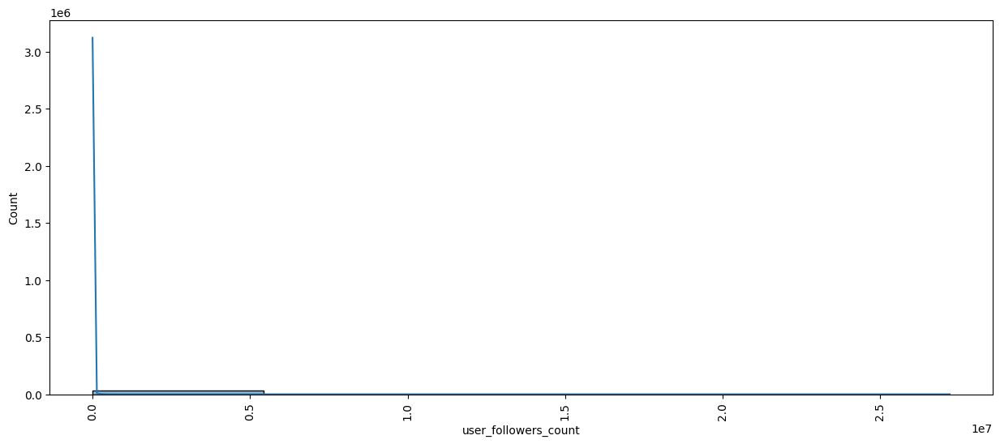

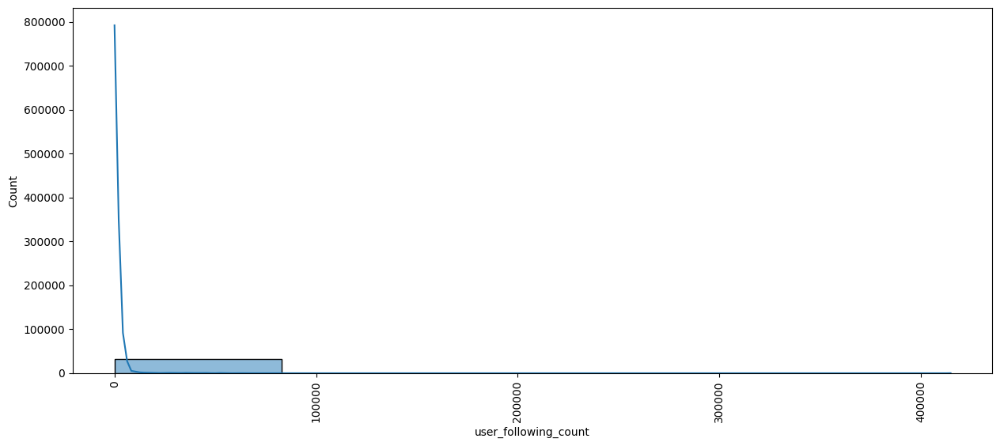

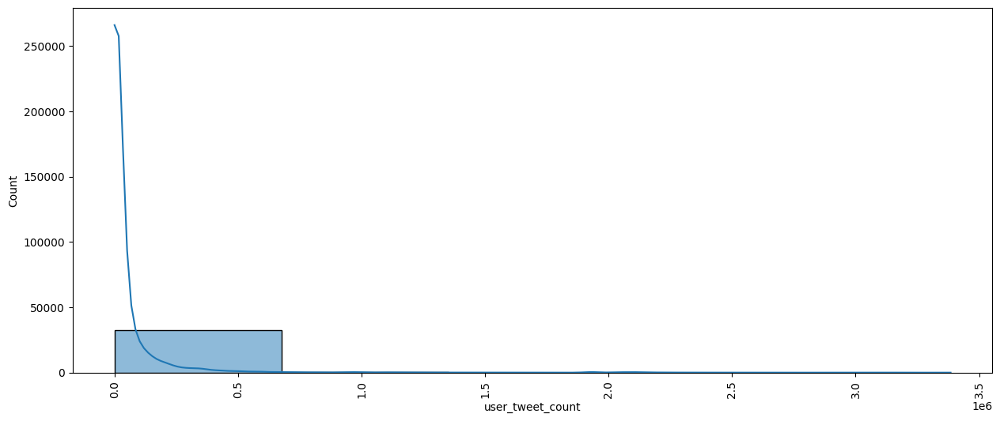

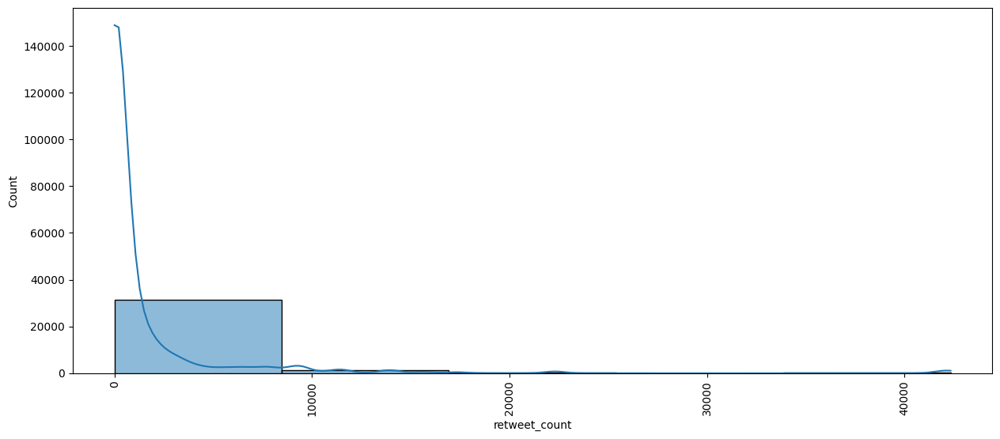

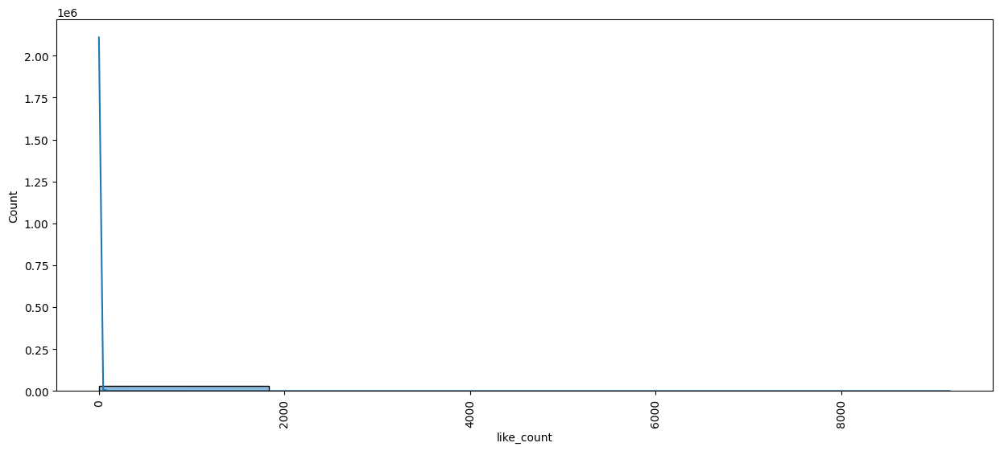

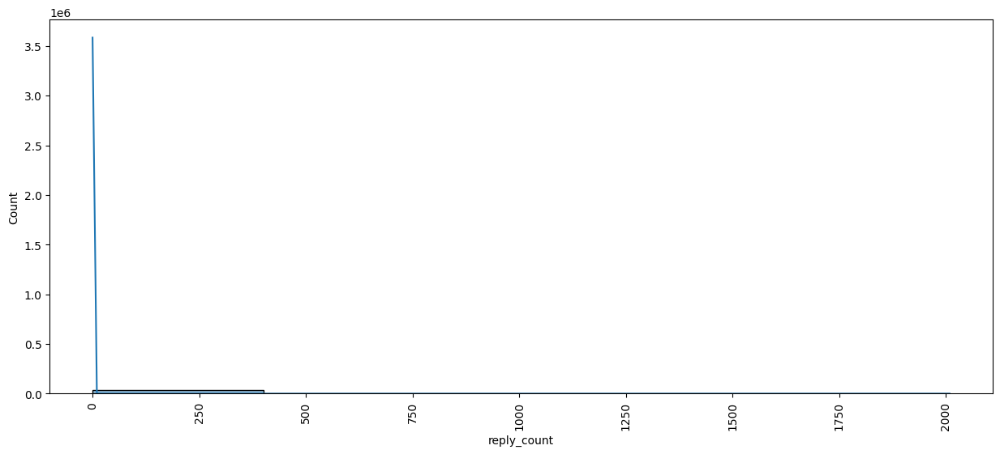

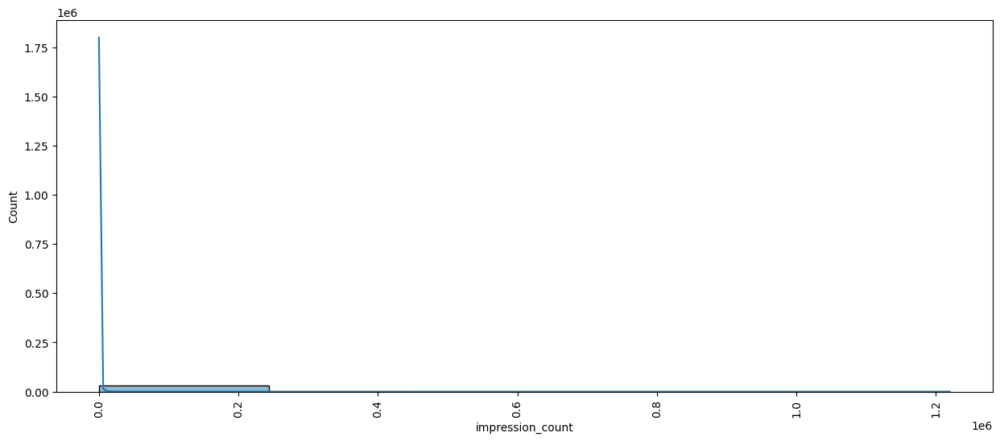

In [ ]:
for i in num_columns:
  plt.figure(figsize=(15,6))
  sns.histplot(df[i], kde=True, bins=5, palette='hls')
  plt.xticks(rotation=90)
  plt.show()

In [ ]:
for col in num_columns:
  fig=px.box(df, y=col, title=f'Box Plot- {col}')
  fig.show()

In [ ]:
for col in num_columns:
  fig=px.violin(df, y=col, title=f'Violin Plot- {col}')
  fig.show()

In [ ]:
import re
from tqdm.notebook import tqdm
from datetime import datetime
import dateutil.parser

In [ ]:
!pip install pyspellchecker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import nltk

In [ ]:
nltk.download('vader_lexicon')
nltk.download('stopwords')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:

from spellchecker import SpellChecker
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
sia=SIA()

In [ ]:
from wordcloud import WordCloud, ImageColorGenerator
from nltk.corpus import stopwords
import random

In [ ]:
data=df.copy()
data['original_tweet']=df['text']
data['datetime']=df['tweet_created']
data['datetime']=data.datetime.apply(lambda x: dateutil.parser.parse(x))
rt_mask = data.text.apply(lambda x: "RT @" in x)

In [ ]:
data.text = data.text.str.lower()
data.text = data.text.apply(lambda x:re.sub('@[^\s]+','',x))
data.text = data.text.apply(lambda x:re.sub(r'\B#\S+','',x))
data.text = data.text.apply(lambda x:re.sub(r"http\S+", "", x))
data.text = data.text.apply(lambda x:' '.join(re.findall(r'\w+', x)))
data.text = data.text.apply(lambda x:re.sub(r'\s+[a-zA-Z]\s+', '', x))
data.text = data.text.apply(lambda x:re.sub(r'\s+', ' ', x, flags=re.I))

In [ ]:
data['datetime']=pd.to_datetime(data['datetime']).dt.tz_localize(None)
data

,tweet_id,tweet_created,tweet_extracted,text,lang,user_id,user_name,user_username,user_created,user_followers_count,user_following_count,user_tweet_count,user_verified,retweet_count,like_count,reply_count,impression_count,original_tweet,datetime
0,1.64E+18,2023-04-03 13:59:44+00:00,07:02.5,rt เทคน คฝ กภาษาก บ chatgpt ท ผมลอง ผมลองฝ ก อ...,th,4706577259,👷🏼 ♡ #GOT7,BPawarisa1a,2016-01-04 02:27:33+00:00,1293.0,445.0,87051.0,False,13640.0,0.0,0.0,0.0,RT @jexep: เทคนิคฝึกภาษากับ ChatGPT ที่ผมลอง (...,2023-04-03 13:59:44
1,1.64E+18,2023-04-03 10:59:22+00:00,06:59.4,chatgptをもっと活かせるchrome拡張機能4選,ja,2264288640,ミミズクりんゆ,DRVO_Project,2013-12-27 12:39:07+00:00,7878.0,4941.0,76597.0,False,0.0,0.0,0.0,290.0,ChatGPTをもっと活かせるChrome拡張機能4選 https://t.co/hfacF...,2023-04-03 10:59:22
2,1.64E+18,2023-04-03 03:59:28+00:00,06:52.5,rt chatgpt plugins are the fastest way to get ...,en,2383245894,pk,pradeep42329225,2014-03-11 06:04:10+00:00,269.0,4141.0,3816.0,False,628.0,0.0,0.0,0.0,RT @DarrellLerner: ChatGPT Plugins are the fas...,2023-04-03 03:59:28
3,1.64E+18,2023-04-03 15:59:59+00:00,07:04.7,get an intelligent chatbot for your website in...,en,1.63304E+18,AR Leyva,ArrheniusLey,2023-03-07 09:43:36+00:00,264.0,24.0,198.0,False,0.0,0.0,0.0,58.0,Get an intelligent chatbot for your website in...,2023-04-03 15:59:59
4,1.64E+18,2023-04-03 01:59:25+00:00,06:50.6,hey guys has launched at just 55 000 usd marke...,en,1.3114E+18,Human Being 🇨🇳🇸🇬🇻🇳,KiarostamiBeing,2020-09-30 20:32:00+00:00,447.0,419.0,12949.0,False,0.0,0.0,0.0,0.0,"🔥Hey Guys, #ZenithSwap has launched at just $ ...",2023-04-03 01:59:25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32997,1653320000000000000.0,2023-05-02 08:59:02+00:00,15:49.0,rt affiliate marketers are making 1 000 000s u...,en,1281360000000000000.0,Stark TheKid,The_last_onee,2020-07-09 22:57:26+00:00,2.0,34.0,373.0,False,1182.0,0.0,0.0,0.0,RT @theecomlife: Affiliate Marketers are makin...,2023-05-02 08:59:02
32998,1653230000000000000.0,2023-05-02 02:59:22+00:00,15:43.3,rt for halfcentury the godfather ofi nurtured ...,en,1628470000000000000.0,Crislin 🩷,outwestwiddit,2023-02-22 18:54:49+00:00,64.0,58.0,1446.0,False,822.0,0.0,0.0,0.0,"RT @Phil_Lewis_: For half a century, “the Godf...",2023-05-02 02:59:22
32999,1653530000000000000.0,2023-05-02 22:59:50+00:00,16:05.0,محاضرة تدريبية بعنوان chatgpt and the downfall...,und,1378740000000000000.0,منصة التعلم الحديث,Ok3go,2021-04-04 15:52:22+00:00,5991.0,1.0,4299.0,False,1.0,0.0,0.0,415.0,محاضرة تدريبية بعنوان : \n\nChatGPT and the Do...,2023-05-02 22:59:50
33000,1653380000000000000.0,2023-05-02 12:59:20+00:00,15:53.9,rt we just gave the worldmost powerful ai acce...,en,1198910000000000000.0,dorayaki,jkdorayaki,2019-11-25 10:08:08+00:00,208.0,336.0,716.0,False,193.0,0.0,0.0,0.0,RT @emollick: We just gave the world’s most po...,2023-05-02 12:59:20


In [ ]:
spell= SpellChecker()

In [ ]:
def label_sentiment(x:float):
    if x < -0.05 : return 'negative'
    if x > 0.35 : return 'positive'
    return 'neutral'

In [ ]:
data['words']=data.text.apply(lambda x:re.findall(r'\w+', x ))
data['errors']=data.words.apply(spell.unknown)
data['errors_count']=data.errors.apply(len)
data['words_count']=data.words.apply(len)
data['sentence_length']=data.text.apply(len)
data['hour'] = data.datetime.apply(lambda x: x.hour)
data['date'] = data.datetime.apply(lambda x: x.date())
data['month'] = data.datetime.apply(lambda x: x.month)
data['year'] = data.datetime.apply(lambda x: x.year)

In [ ]:
data

,tweet_id,tweet_created,tweet_extracted,text,lang,user_id,user_name,user_username,user_created,user_followers_count,...,datetime,words,errors,errors_count,words_count,sentence_length,hour,date,month,year
0,1.64E+18,2023-04-03 13:59:44+00:00,07:02.5,rt เทคน คฝ กภาษาก บ chatgpt ท ผมลอง ผมลองฝ ก อ...,th,4706577259,👷🏼 ♡ #GOT7,BPawarisa1a,2016-01-04 02:27:33+00:00,1293.0,...,2023-04-03 13:59:44,"[rt, เทคน, คฝ, กภาษาก, บ, chatgpt, ท, ผมลอง, ผ...","{กภาษาก, ได, ธ, าพอใจคร, งกฤษ, คฝ, เหล, เยอรม,...",27,33,119,13,2023-04-03,4,2023
1,1.64E+18,2023-04-03 10:59:22+00:00,06:59.4,chatgptをもっと活かせるchrome拡張機能4選,ja,2264288640,ミミズクりんゆ,DRVO_Project,2013-12-27 12:39:07+00:00,7878.0,...,2023-04-03 10:59:22,[chatgptをもっと活かせるchrome拡張機能4選],{chatgptをもっと活かせるchrome拡張機能4選},1,1,27,10,2023-04-03,4,2023
2,1.64E+18,2023-04-03 03:59:28+00:00,06:52.5,rt chatgpt plugins are the fastest way to get ...,en,2383245894,pk,pradeep42329225,2014-03-11 06:04:10+00:00,269.0,...,2023-04-03 03:59:28,"[rt, chatgpt, plugins, are, the, fastest, way,...","{2023ve, plugins, createdstep, chatgpt, rt}",5,22,113,3,2023-04-03,4,2023
3,1.64E+18,2023-04-03 15:59:59+00:00,07:04.7,get an intelligent chatbot for your website in...,en,1.63304E+18,AR Leyva,ArrheniusLey,2023-03-07 09:43:36+00:00,264.0,...,2023-04-03 15:59:59,"[get, an, intelligent, chatbot, for, your, web...","{itthat, chatbase, uploaddocument, chatgpt, ch...",5,41,231,15,2023-04-03,4,2023
4,1.64E+18,2023-04-03 01:59:25+00:00,06:50.6,hey guys has launched at just 55 000 usd marke...,en,1.3114E+18,Human Being 🇨🇳🇸🇬🇻🇳,KiarostamiBeing,2020-09-30 20:32:00+00:00,447.0,...,2023-04-03 01:59:25,"[hey, guys, has, launched, at, just, 55, 000, ...","{marketcap, defi, usd, chatgpt, arb, zsp, 4x}",7,34,176,1,2023-04-03,4,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32997,1653320000000000000.0,2023-05-02 08:59:02+00:00,15:49.0,rt affiliate marketers are making 1 000 000s u...,en,1281360000000000000.0,Stark TheKid,The_last_onee,2020-07-09 22:57:26+00:00,2.0,...,2023-05-02 08:59:02,"[rt, affiliate, marketers, are, making, 1, 000...","{000s, rt, chatgpt, donknow}",4,22,118,8,2023-05-02,5,2023
32998,1653230000000000000.0,2023-05-02 02:59:22+00:00,15:43.3,rt for halfcentury the godfather ofi nurtured ...,en,1628470000000000000.0,Crislin 🩷,outwestwiddit,2023-02-22 18:54:49+00:00,64.0,...,2023-05-02 02:59:22,"[rt, for, halfcentury, the, godfather, ofi, nu...","{halfcentury, rt, chatbots, chatgpt}",4,19,113,2,2023-05-02,5,2023
32999,1653530000000000000.0,2023-05-02 22:59:50+00:00,16:05.0,محاضرة تدريبية بعنوان chatgpt and the downfall...,und,1378740000000000000.0,منصة التعلم الحديث,Ok3go,2021-04-04 15:52:22+00:00,5991.0,...,2023-05-02 22:59:50,"[محاضرة, تدريبية, بعنوان, chatgpt, and, the, d...","{رابط, الأربعاء, مساء, محاضرة, الحضور, بعنوان,...",11,25,132,22,2023-05-02,5,2023
33000,1653380000000000000.0,2023-05-02 12:59:20+00:00,15:53.9,rt we just gave the worldmost powerful ai acce...,en,1198910000000000000.0,dorayaki,jkdorayaki,2019-11-25 10:08:08+00:00,208.0,...,2023-05-02 12:59:20,"[rt, we, just, gave, the, worldmost, powerful,...","{rt, worldmost}",2,22,122,12,2023-05-02,5,2023


In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia=SIA()

In [ ]:
data['sentiment'] = [sia.polarity_scores(x)['compound'] for x in tqdm(data['text'])]
data['overall_sentiment'] = data['sentiment'].apply(label_sentiment);

  0%|          | 0/32995 [00:00<?, ?it/s]

In [ ]:
data.head(20)

In [ ]:
data_corr= data.corr()
data_corr

In [ ]:
import plotly.graph_objects as go

In [ ]:
matrix = np.triu(data_corr)

fig = go.Figure(data=go.Heatmap(
    z=data_corr,
    x=data_corr.columns,
    y=data_corr.columns,
    colorscale="Viridis",
    text=data_corr.values.round(2),
    hovertemplate='Correlation: %{text}<extra></extra>',
    hoverongaps=False,
))

fig.update_layout(
    width=900,
    height=900,
    title="Correlation Heatmap",
)

fig.show()

In [ ]:
data['overall_sentiment'].unique()

In [ ]:
value_counts=data['overall_sentiment'].value_counts()
value_counts

In [ ]:
bar_fig = go.Figure(data=[go.Bar(
    x=value_counts.index,
    y=value_counts.values,
    marker_color='blue'
)])

In [ ]:
bar_fig.update_layout(
    title='Overall Sentiment Value Counts (Bar Plot)',
    xaxis_title='Sentiment',
    yaxis_title='Count'
)

In [ ]:
pie_fig = go.Figure(data=[go.Pie(
    labels=value_counts.index,
    values=value_counts.values
)])

In [ ]:
pie_fig.update_layout(
    title='Overall Sentiment Value Counts (Pie Plot)'
)

In [ ]:
title = "User Count of Tweets\nPlotting the average number of User Tweet Count for certain hour period of the day"

beta = 0.99  # Higher value -> smoother curve

length = data.groupby('datetime')['user_tweet_count'].mean()
length_std = length.std()
length = length[length < 3 * length_std]

weighted_length = length.ewm(alpha=1 - beta).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    name="Hourly Average User Tweet Count",
    x=length.index,
    y=length.values,
    mode="markers",
    opacity=0.3,
    marker_color="tan"
))

fig.add_trace(go.Scatter(
    name="Weighted Average User Tweet Count",
    x=weighted_length.index,
    y=weighted_length.values,
    opacity=0.8,
    marker_color='yellow'
))

fig.update_layout(
    hovermode='x',
    title=title,
    xaxis_title="Time",
    yaxis_title="Average Word Count per tweet",
    template="plotly_dark",
    legend_orientation='h'
)

fig.show()

In [ ]:
title = "Sentence Length of Tweets\nPlotting the average length of sentence lengths for certain hour period of the day"

beta = 0.99  # Higher value -> smoother curve

length = data.groupby('datetime')['sentence_length'].mean()
length_std = length.std()
length = length[length < 3 * length_std]

weighted_length = length.ewm(alpha=1 - beta).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    name="Hourly Average Sentence Length",
    x=length.index,
    y=length.values,
    mode="markers",
    opacity=0.3,
    marker_color="tan"
))

fig.add_trace(go.Scatter(
    name="Weighted Average Sentence Length",
    x=weighted_length.index,
    y=weighted_length.values,
    opacity=0.8,
    marker_color='yellow'
))

fig.update_layout(
    hovermode='x',
    title=title,
    xaxis_title="Time",
    yaxis_title="Average Sentence Length",
    template="plotly_dark",
    legend_orientation='h'
)

fig.show()

In [ ]:
title = "Word Count of Tweets\nPlotting the average number of Word Count for certain hour period of the day"

beta = 0.99  # Higher value -> smoother curve

length = data.groupby('datetime')['words_count'].mean()
length_std = length.std()
length = length[length < 3 * length_std]

weighted_length = length.ewm(alpha=1 - beta).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    name="Hourly Average Word Count",
    x=length.index,
    y=length.values,
    mode="markers",
    opacity=0.3,
    marker_color="tan"
))

fig.add_trace(go.Scatter(
    name="Weighted Average Word Count",
    x=weighted_length.index,
    y=weighted_length.values,
    opacity=0.8,
    marker_color='yellow'
))

fig.update_layout(
    hovermode='x',
    title=title,
    xaxis_title="Time",
    yaxis_title="Average Word Count",
    template="plotly_dark",
    legend_orientation='h'
)

fig.show()

In [ ]:
title = "Retweets Count of Tweets\nPlotting the average number of Retweet Count for certain hour period of the day"

beta = 0.99  # Higher value -> smoother curve

count = data.groupby('datetime')['retweet_count'].mean()
count_std = count.std()
count = count[count < 3 * count_std]

weighted_count = count.ewm(alpha=1 - beta).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    name="Hourly Average Retweet Count",
    x=count.index,
    y=count.values,
    mode="markers",
    opacity=0.3,
    marker_color="tan"
))

fig.add_trace(go.Scatter(
    name="Weighted Average Retweet Count",
    x=weighted_count.index,
    y=weighted_count.values,
    opacity=0.8,
    marker_color='yellow'
))

fig.update_layout(
    hovermode='x',
    title=title,
    xaxis_title="Time",
    yaxis_title="Average Retweet Count",
    template="plotly_dark",
    legend_orientation='h'
)

fig.show()

In [ ]:
title = "Like Count of Tweets\nPlotting the average number of Likes for certain hour period of the day"

beta = 0.99  # Higher value -> smoother curve

count = data.groupby('datetime')['like_count'].mean()
count_std = count.std()
count = count[count < 3 * count_std]

weighted_count = count.ewm(alpha=1 - beta).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    name="Hourly Average Like Count",
    x=count.index,
    y=count.values,
    mode="markers",
    opacity=0.3,
    marker_color="tan"
))

fig.add_trace(go.Scatter(
    name="Weighted Average Like Count",
    x=weighted_count.index,
    y=weighted_count.values,
    opacity=0.8,
    marker_color='yellow'
))

fig.update_layout(
    hovermode='x',
    title=title,
    xaxis_title="Time",
    yaxis_title="Average Like Count",
    template="plotly_dark",
    legend_orientation='h'
)

fig.show()

In [ ]:
data.columns

In [ ]:
histogram = go.Histogram(
    x=data['sentence_length'],
    nbinsx=20,
    marker=dict(color='skyblue'),
    opacity=0.7
)

# Create the layout
layout = go.Layout(
    title='Sentence Length Distribution',
    xaxis=dict(title='Sentence Length'),
    yaxis=dict(title='Frequency'),
    bargap=0.1,
    bargroupgap=0.1
)

# Create the figure and add the histogram trace
fig = go.Figure(data=[histogram], layout=layout)

# Display the figure
fig.show()

In [ ]:
top_5_lang = data['lang'].value_counts().nlargest(5).index

# Filter the data for the top 5 languages
filtered_data = data[data['lang'].isin(top_5_lang)]

# Group the filtered data by language and calculate sentence lengths
grouped_data = filtered_data.groupby('lang')['sentence_length'].apply(list)

# Create a list to store the histograms
histograms = []

# Create a histogram for each language group
for lang, lengths in grouped_data.items():
    histogram = go.Histogram(
        x=lengths,
        nbinsx=20,
        name=lang,
        opacity=0.7
    )
    histograms.append(histogram)

# Create the layout
layout = go.Layout(
    title='Sentence Length Distribution by Top 5 Languages',
    xaxis=dict(title='Sentence Length'),
    yaxis=dict(title='Frequency'),
    bargap=0.1,
    bargroupgap=0.1
)

# Create the figure and add the histograms
fig = go.Figure(data=histograms, layout=layout)

# Display the figure
fig.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
encoder=LabelEncoder()
data['overall_sentiment_code']= encoder.fit_transform(data['overall_sentiment'])
# Group the data by hour and overall sentiment, and calculate the count for each group
hourly_sentiment_counts = data.groupby(['hour', 'overall_sentiment']).size().unstack()

# Create a bar plot for each label
colors = ['skyblue', 'orange', 'green']  # Specify colors for each label
labels = hourly_sentiment_counts.columns
x = hourly_sentiment_counts.index

# Plot the bars for each label
for i, label in enumerate(labels):
    y = hourly_sentiment_counts[label]
    plt.bar(x, y, color=colors[i], label=label)

# Set the plot title, legend, and axis labels
plt.title('Hourly Overall Sentiment of Tweets')
plt.xlabel('Hour')
plt.ylabel('Count')
plt.legend()

# Display the plot
plt.show()

In [ ]:
data['overall_sentiment_code']

In [ ]:
filtered_data = data[data['overall_sentiment'].isin(['positive', 'negative', 'neutral'])]

# Group the filtered data by hour and overall sentiment, and calculate the count for each group
hourly_sentiment_counts = filtered_data.groupby(['hour', 'overall_sentiment']).size().unstack()

# Plot the comparative bar plot for each hour
colors = ['skyblue', 'orange', 'green']  # Specify colors for each sentiment label
labels = hourly_sentiment_counts.columns
x = hourly_sentiment_counts.index

# Iterate over each hour
for i in range(len(x)):
    y = hourly_sentiment_counts.iloc[i]
    plt.bar(labels, y, color=colors)

    # Set the plot title, legend, and axis labels for each hour
    plt.title(f"Sentiment Distribution for Hour {x[i]}")
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.legend(labels)

    # Display the plot for each hour
    plt.show()

In [ ]:
data

In [ ]:
data['words']

In [ ]:
data.columns

In [ ]:
df_new=data.copy()

In [ ]:
def clean_text(text):
  text=text.lower()
  return text.strip()

In [ ]:
df_new['text'] = df_new['text'].apply(lambda x: clean_text(x))

In [ ]:
import string
string.punctuation

In [ ]:
def remove_punctuation(text):
    punctuationfree="".join([i for i in text if i not in string.punctuation])
    return punctuationfree
df_new['text']= df_new['text'].apply(lambda x:remove_punctuation(x))

In [ ]:
import re
def tokenization(text):
    tokens = re.split('W+',text)
    return tokens

In [ ]:
df_new['text']= df_new['text'].apply(lambda x: tokenization(x))

In [ ]:
stopwords = nltk.corpus.stopwords.words('english')

In [ ]:
def remove_stopwords(text):
    output= " ".join(i for i in text if i not in stopwords)
    return output

In [ ]:
df_new['text']= df_new['text'].apply(lambda x:remove_stopwords(x))

In [ ]:
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer = WordNetLemmatizer()

In [ ]:
def lemmatizer(text):
    lemm_text = "".join([wordnet_lemmatizer.lemmatize(word) for word in text])
    return lemm_text

In [ ]:
nltk.download('wordnet')

In [ ]:
df_new['text']=df_new['text'].apply(lambda x:lemmatizer(x))

In [ ]:
def clean_text(text):
    text = re.sub('\[.*\]','', text).strip() # Remove text in square brackets
    text = re.sub('\S*\d\S*\s*','', text).strip()  # Remove words containing numbers
    return text.strip()

In [ ]:
df_new['text'] = df_new['text'].apply(lambda x: clean_text(x))

In [ ]:
def remove_urls(vTEXT):
    vTEXT = re.sub(r'(https|http)?:\/\/(\w|\.|\/|\?|\=|\&|\%)*\b', '', vTEXT, flags=re.MULTILINE)
    return(vTEXT)

In [ ]:
df_new['text'] = df_new['text'].apply(lambda x: remove_urls(x))

In [ ]:
def remove_digits(text):
    clean_text = re.sub(r"\b[0-9]+\b\s*", "", text)
    return(text)

In [ ]:
df_new['text'] = df_new['text'].apply(lambda x: remove_digits(x))

In [ ]:
def remove_emojis(data):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               "]+", flags=re.UNICODE)
    return re.sub(emoji_pattern, '', data)

In [ ]:
df_new['text'] = df_new['text'].apply(lambda x: remove_emojis(x))

In [ ]:
df_new['text'] = df_new['text'].apply(lambda x: re.sub(r'\brt\b', '', x))

In [ ]:
df_new['text']

In [ ]:
en_data = df_new[df_new['lang'] == 'en']

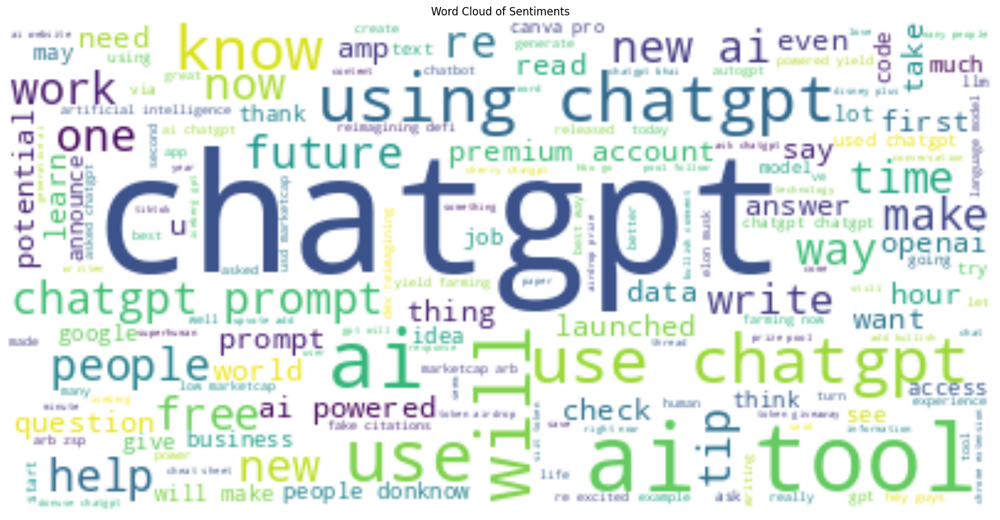

In [ ]:
from wordcloud import WordCloud

# Concatenate all the text data into a single string
text_data = ' '.join(en_data['text'])

# Generate the word cloud
wordcloud = WordCloud(background_color='white').generate(text_data)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(30, 10))

# Display the word cloud
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

# Set the plot title
ax.set_title('Word Cloud of Sentiments')

# Show the plot
plt.show()

In [ ]:
# Concatenate all the text data into a single string
text_data = ' '.join(en_data['text'])

# Generate the word cloud
wordcloud = WordCloud(background_color='white').generate(text_data)

# Get the top ten words by frequency
top_words = dict(sorted(wordcloud.words_.items(), key=lambda x: x[1], reverse=True)[:10])

# Create a bar plot using Plotly
fig = px.bar(
    x=list(top_words.values()),
    y=list(top_words.keys()),
    orientation='h',
    labels={'x': 'Frequency', 'y': 'Word'},
)

# Set the plot title
fig.update_layout(title='Top 10 Words in Word Cloud')

# Display the plot
fig.show()

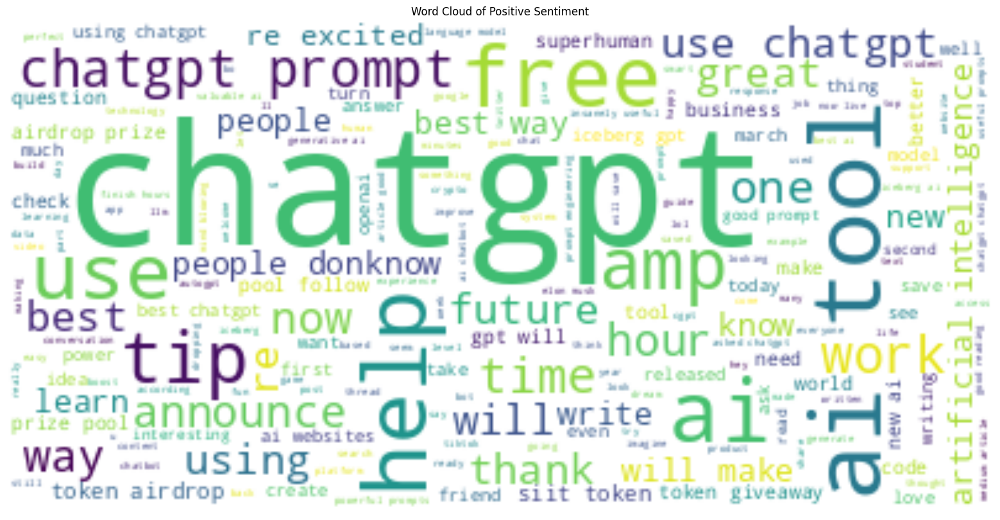

In [ ]:
# Filter the text data for positive sentiment
positive_text_data = ' '.join(en_data[en_data['overall_sentiment'] == 'positive']['text'])

# Generate the word cloud for positive sentiment
wordcloud = WordCloud(background_color='white').generate(positive_text_data)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(30, 10))

# Display the word cloud
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_axis_off()

# Set the plot title
ax.set_title('Word Cloud of Positive Sentiment')

# Show the plot
plt.show()

In [ ]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


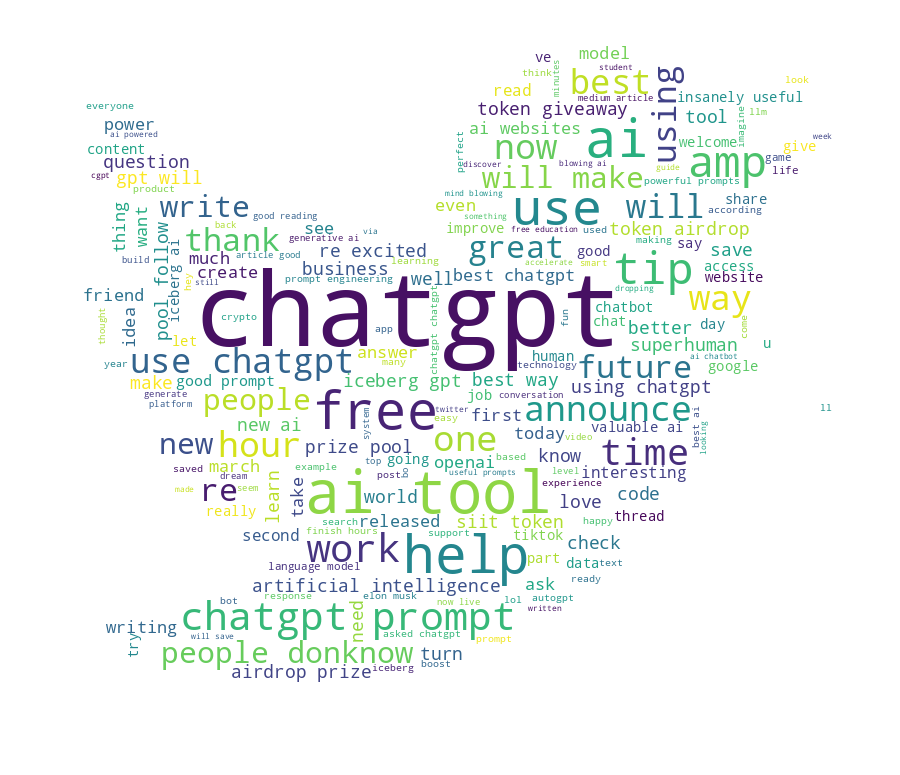

In [ ]:
twitter_mask = np.array(Image.open('Twitterbird.png'))
wc = WordCloud(
    background_color='white',
    max_words=200,
    mask=twitter_mask
)

# Generate the word cloud for positive sentiment
positive_text = ' '.join(text for text in en_data.loc[en_data['overall_sentiment'] == 'positive', 'text'])
wc.generate(positive_text)

# Create a Plotly figure
fig = go.Figure(data=go.Image(z=wc.to_array()))
fig.update_layout(
    title='Top words for Positive Tweets',
    title_font_size=22,
    images=[go.layout.Image(
        source=wc.to_image(),
        xref="x",
        yref="y",
        x=0,
        y=0,
        sizex=1,
        sizey=1,
        sizing="stretch",
        opacity=1,
        layer="below")]
)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

# Display the plotly figure
fig.show()

In [ ]:
en_data.shape

(15239, 31)

In [ ]:
en_data.columns

Index(['tweet_id', 'tweet_created', 'tweet_extracted', 'text', 'lang',
       'user_id', 'user_name', 'user_username', 'user_created',
       'user_followers_count', 'user_following_count', 'user_tweet_count',
       'user_verified', 'retweet_count', 'like_count', 'reply_count',
       'impression_count', 'original_tweet', 'datetime', 'words', 'errors',
       'errors_count', 'words_count', 'sentence_length', 'hour', 'date',
       'month', 'year', 'sentiment', 'overall_sentiment',
       'overall_sentiment_code'],
      dtype='object')

In [ ]:
df1 = en_data[['text', 'overall_sentiment']]

In [ ]:
df1

,text,overall_sentiment
2,chatgpt plugins are the fastest way to get ri...,positive
3,get an intelligent chatbot for your website in...,positive
4,hey guys has launched at just usd marketcap th...,negative
5,now join dataland chatgpt tasks ①log in to lt...,neutral
9,the plagiarism detector will introduce its det...,positive
...,...,...
32994,ai is coming for our jobs check out this artic...,negative
32995,use for free on get chatgpt prodigy chrome ext...,neutral
32997,affiliate marketers are making using chatgpt ...,neutral
32998,for halfcentury the godfather ofi nurtured th...,positive


In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [ ]:
stopwords = nlp.Defaults.stop_words
def lemmatizer(text):
    doc = nlp(text)
    sent = [token.lemma_ for token in doc if not token.text in set(stopwords)]
    return ' '.join(sent)

In [ ]:
df1['text'] =  df1['text'].apply(lambda x: lemmatizer(x))

In [ ]:
df1

In [ ]:
df1 = df1.drop(index=5)


In [ ]:
df1

,text,overall_sentiment
2,chatgpt plugin fast way rich createdstep ste...,2
3,intelligent chatbot website minute chatbase ai...,2
4,hey guy launch usd marketcap chatgpt dex reima...,0
9,plagiarism detector introduce detection tool t...,2
10,germany follow italyfootsteps block chatgpt da...,0
...,...,...
32994,ai come job check article software engineer pa...,0
32995,use free chatgpt prodigy chrome extension hand...,1
32997,affiliate marketer make chatgpt people donkn...,1
32998,halfcentury godfather ofi nurture technology...,2


In [ ]:
x=df1['text']
y=df1['overall_sentiment']
print(len(x), len(y))

15238 15238


In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, shuffle = True, stratify = df1['overall_sentiment'],
                                                    random_state=42)
print(len(x_train), len(y_train))
print(len(x_test), len(y_test))

11428 11428
3810 3810


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

vect = CountVectorizer()
vect.fit(x_train)

CountVectorizer()

In [ ]:
x_train_dtm = vect.transform(x_train)
x_test_dtm = vect.transform(x_test)

In [ ]:
vect_tunned = CountVectorizer(stop_words='english', ngram_range=(1,2), min_df=0.1, max_df=0.7, max_features=100)

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()

tfidf_transformer.fit(x_train_dtm)
x_train_tfidf = tfidf_transformer.transform(x_train_dtm)

x_train_tfidf

<11428x14318 sparse matrix of type '<class 'numpy.float64'>'
	with 109544 stored elements in Compressed Sparse Row format>

In [ ]:
texts = df1['text']
target = df1['overall_sentiment']

In [ ]:
from keras.preprocessing.text import Tokenizer

In [ ]:
word_tokenizer = Tokenizer()
word_tokenizer.fit_on_texts(texts)

vocab_length = len(word_tokenizer.word_index) + 1
vocab_length

16875

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from nltk.tokenize import word_tokenize

In [ ]:
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
def embed(corpus):
    return word_tokenizer.texts_to_sequences(corpus)

longest_train = max(texts, key=lambda sentence: len(word_tokenize(sentence)))
length_long_sentence = len(word_tokenize(longest_train))

train_padded_sentences = pad_sequences(
    embed(texts),
    length_long_sentence,
    padding='post'
)

In [ ]:
train_padded_sentences

array([[   1,  107,  249, ...,    0,    0,    0],
       [ 653,   66,   44, ...,    0,    0,    0],
       [  99,  112,   31, ...,    0,    0,    0],
       ...,
       [ 878,  681,   95, ...,    0,    0,    0],
       [2435,  988, 2061, ...,    0,    0,    0],
       [ 137, 2433,   50, ...,    0,    0,    0]], dtype=int32)

In [ ]:
!wget http://nlp.stanford.edu/data/glove.6B.zip


--2023-06-12 10:29:33--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2023-06-12 10:29:33--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2023-06-12 10:29:33--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

In [ ]:
!unzip glove*.zip

Archive:  glove.6B.zip
  inflating: glove.6B.50d.txt        
  inflating: glove.6B.100d.txt       
  inflating: glove.6B.200d.txt       
  inflating: glove.6B.300d.txt       


In [ ]:
embeddings_dictionary = dict()
embedding_dim = 100

# Load GloVe 100D embeddings
with open('glove.6B.100d.txt', encoding="utf8") as fp:
    for line in fp.readlines():
        records = line.split()
        word = records[0]
        vector_dimensions = np.asarray(records[1:], dtype='float32')
        embeddings_dictionary [word] = vector_dimensions

In [ ]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(x_train_dtm, y_train)

MultinomialNB()

In [ ]:
y_pred_class = nb.predict(x_test_dtm)
y_pred_prob = nb.predict_proba(x_test_dtm)[:, 1]

In [ ]:
from sklearn import metrics
print(metrics.accuracy_score(y_test, y_pred_class))

0.7934383202099737


In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline

pipe = Pipeline([('bow', CountVectorizer()),
                 ('tfid', TfidfTransformer()),
                 ('model', MultinomialNB())])

In [ ]:
pipe.fit(x_train, y_train)

y_pred_class = pipe.predict(x_test)

print(metrics.accuracy_score(y_test, y_pred_class))

0.773753280839895


In [ ]:
import xgboost as xgb

pipe = Pipeline([
    ('bow', CountVectorizer()),
    ('tfid', TfidfTransformer()),
    ('model', xgb.XGBClassifier(
        learning_rate=0.1,
        max_depth=7,
        n_estimators=80,
        use_label_encoder=False,
        eval_metric='auc',
    ))
])

In [ ]:
pipe.fit(x_train, y_train)
y_pred_class = pipe.predict(x_test)
print(metrics.accuracy_score(y_test, y_pred_class))

0.7863517060367454


In [ ]:
import pickle

In [ ]:
# Save the trained model and fitted CountVectorizer
model = {'nb': nb, 'vect': vect}
with open("nb_model.pkl", "wb") as file:
    pickle.dump(model, file)

In [ ]:
import joblib

In [ ]:
model = {'nb': nb, 'vect': vect}
joblib.dump(model, "nb_model.joblib")

['nb_model.joblib']